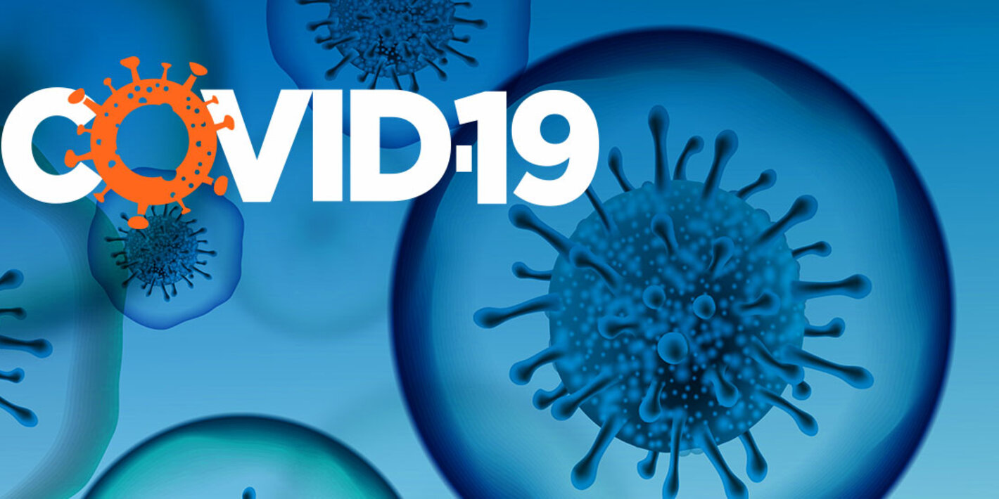

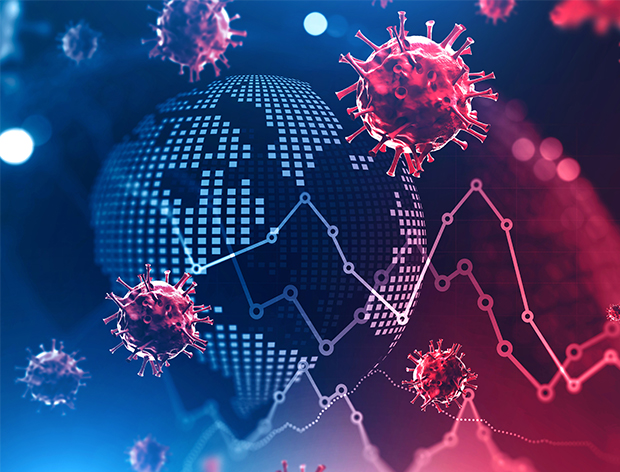



# Introduction

It has been over a full year since we started this difficult battle against Covid-19. These fast-spreading microscopic creatures that are too small to be even be seen with the naked eye have somehow shaken the entire world and changed life as we know it. 

People all over the world are racing against the clock to fight this pandemic.

We as engineering students can do our part in finding solutions through datasets provided by various sources on the current situation. We can derive meaningful insights through these datasets which could aid the fight against covid-19



## Technology Used
In this analysis, We use python as the primary programming language because of its rich palette of tools that make data analysis a cinch. Some of the python packages used are:
1. Plotly- An extremely versatile library of tools for generating interactive plots that are easy to interpret and customise
2. Numpy - A popular library used for array manipulation and vector operations. It is used extensively across python projects that require scientific computing.
3. Pandas -Another library for data science which provides easy to use data structures and functions to manipulate structured data.


In [1]:
# imports 
import math
import numpy as np 
import pandas as pd 
import plotly.express as ex
import plotly.graph_objects as go
import plotly.offline as pyo
from datetime import datetime
pyo.init_notebook_mode()

In [2]:
# load data
vacc_df = pd.read_csv("https://raw.githubusercontent.com/ashwin482/datasets/main/country_vaccinations.csv")
summary_df = pd.read_csv("https://raw.githubusercontent.com/ashwin482/datasets/main/worldometer_coronavirus_summary_data.csv")
daily_df = pd.read_csv("https://raw.githubusercontent.com/ashwin482/datasets/main/worldometer_coronavirus_daily_data.csv")

# Data Cleaning

The most important step to take before we get started generating any kind of information from all these data sources, it is first important to clean our data and make sure that the datasets are compatible with each other. Since most of the data is divided on a country-by-country basis, we must make sure that all the country names have the same formatting. 

For instance, "United States of America" may be written as "USA", "United Kingdom" as "UK" and so on. We will explore this problem and others in this section. We will prioritize only those countries for which vaccination data is available since most countries have either not yet started vaccinations or do not yet have sufficiently available public data.

## Standardize Country Names

### Steps followed:
- Identify the differences 
- Plan on how to unify them 
- Implement in code 

In [4]:
# Identify the differences
print("Countries in the Vaccination Data not in Summary Data")
print([x for x in vacc_df.country.unique() if x not in summary_df.country.unique()])

Countries in the Vaccination Data not in Summary Data
['Antigua and Barbuda', 'Bosnia and Herzegovina', 'Brunei', 'Cape Verde', "Cote d'Ivoire", 'Czechia', 'England', 'Eswatini', 'Falkland Islands', 'Guernsey', 'Hong Kong', 'Isle of Man', 'Jersey', 'Kosovo', 'Macao', 'Nauru', 'North Macedonia', 'Northern Cyprus', 'Northern Ireland', 'Palestine', 'Saint Helena', 'Saint Kitts and Nevis', 'Saint Vincent and the Grenadines', 'Sao Tome and Principe', 'Scotland', 'Tonga', 'Trinidad and Tobago', 'Turks and Caicos Islands', 'United Kingdom', 'United States', 'Vietnam', 'Wales']


Let us see if we can find their equivalent in the Summary Dataset 

In [5]:
print(summary_df.country.unique().tolist())

['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Anguilla', 'Antigua And Barbuda', 'Argentina', 'Armenia', 'Aruba', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bermuda', 'Bhutan', 'Bolivia', 'Bosnia And Herzegovina', 'Botswana', 'Brazil', 'British Virgin Islands', 'Brunei Darussalam', 'Bulgaria', 'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada', 'Caribbean Netherlands', 'Cayman Islands', 'Central African Republic', 'Chad', 'Channel Islands', 'Chile', 'China Hong Kong Sar', 'China Macao Sar', 'China', 'Colombia', 'Comoros', 'Congo', 'Costa Rica', 'Cote D Ivoire', 'Croatia', 'Cuba', 'Curacao', 'Cyprus', 'Czech Republic', 'Democratic Republic Of The Congo', 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Ethiopia', 'Faeroe Islands', 'Falkland Islands Malvinas', 'Fiji', 'Finland', 'Fra

From the above list, using `Ctrl+F` to search, we quickly find some equivalents as :

**Replace**
- 'Czechia' == "Czech Republic"
- 'Isle of Man' == "Isle Of Man" 
- 'United Kingdom' == "UK"
- 'United States' == "USA"
- 'Northern Cyprus' == "Cyprus"

**Drop** 
- England 
- Wales 
- Scotland 
- Northern Ireland

(since they are a part of the UK) 

In [6]:
# Implement the above
vacc_df.country = vacc_df.country.replace().replace({
    "Czechia": "Czech Republic", 
    "United States": "USA", 
    "United Kingdom": "UK", 
    "Isle of Man": "Isle Of Man",
    "Republic of Ireland": "Ireland",
    "Northern Cyprus" : "Cyprus"
})

# drop these 3 since they are included in UK 
vacc_df = vacc_df[vacc_df.country.apply(lambda x: x not in ['England', 'Scotland', 'Wales', 'Northern Ireland'])]

In [7]:
# function to easily agrregate columns
def aggregate(df: pd.Series, agg_col: str) -> pd.DataFrame:
    
    data = df.groupby("country")[agg_col].max()
    data = pd.DataFrame(data)
    
    return data

## Extend the Summary Data

The summary dataset already contains a lot of aggregate data about the virus itself but no information surrounding the vaccinations. So we will use the Vaccination dataset to add this information as new columns. This will make it significantly more convenient to process and visualize later on.

New Information:

- Number of vaccine doses administered
- Total number of unique people vaccinated 
- Total number of people fully vaccinated
- Number of vaccine doses administered per hundred
- Total number of unique people vaccinated per hundred
- Total number of people fully vaccinated per hundred 
- Vaccine combinations in use for each country
- Percentage of the total population vaccinated
- Percentage of the tested that returned positive


The numeric columns in the Vaccination dataset other than the ones marked "daily" are cumulative data. Hence the latest value will be the maximum among the column. For this reason, we will using the `groupby.max()` function as it works well with `NaN` values.

In [8]:
# define the columns we want to summarize
cols_to_summarize = ['people_vaccinated', 
                     'people_vaccinated_per_hundred', 
                     'people_fully_vaccinated', 
                     'people_fully_vaccinated_per_hundred', 
                     'total_vaccinations_per_hundred', 
                     'total_vaccinations']

summary = summary_df.set_index("country")
vaccines = vacc_df[['country', 'vaccines']].drop_duplicates().set_index('country')
summary = summary.join(vaccines)

for col in cols_to_summarize:   
    summary = summary.join(aggregate(vacc_df, col))

summary['percentage_vaccinated'] = summary.total_vaccinations / summary.population * 100
summary['tested_positive'] = summary.total_confirmed / summary.total_tests * 100

In [9]:
# Data used for this section
summary.head(5)

,continent,total_confirmed,total_deaths,total_recovered,active_cases,serious_or_critical,total_cases_per_1m_population,total_deaths_per_1m_population,total_tests,total_tests_per_1m_population,population,vaccines,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,total_vaccinations_per_hundred,total_vaccinations,percentage_vaccinated,tested_positive
country,,,,,,,,,,,,,,,,,,,,
Afghanistan,Asia,57898,2546.0,52168,3184,1124.0,1461,64.0,382972.0,9666.0,39621758,Oxford/AstraZeneca,120000.0,0.31,NaN,NaN,0.31,120000.0,0.302864,15.118077
Albania,Europe,129594,2342.0,101584,25668,18.0,45072,815.0,603410.0,209861.0,2875289,"Pfizer/BioNTech, Sinovac",6073.0,0.21,655.0,0.02,11.57,332905.0,11.578140,21.476939
Algeria,Africa,119642,3155.0,83397,33090,21.0,2690,71.0,230861.0,5190.0,44478489,Sputnik V,NaN,NaN,NaN,NaN,0.17,75000.0,0.168621,51.824258
Andorra,Europe,12805,123.0,12203,479,29.0,165516,1590.0,193595.0,2502391.0,77364,"Oxford/AstraZeneca, Pfizer/BioNTech",9781.0,12.66,4484.0,5.80,24.67,19064.0,24.641952,6.614324
Angola,Africa,24389,561.0,22597,1231,20.0,724,17.0,445121.0,13219.0,33671949,Oxford/AstraZeneca,245442.0,0.75,NaN,NaN,0.75,245442.0,0.728921,5.479184


**Note**: We notice that not all countries have all summary information available. So we need to be careful about how we handle `NaN` values

# Visualizations


In [10]:
# helper functions 
def get_multi_line_title(title:str, subtitle:str):
    return f"{title}<br><sub>{subtitle}</sub>"

def visualize_column(data: pd.DataFrame, xcolumn: str, ycolumn:str, title:str, colors:str, ylabel="Count", n=None):
    hovertemplate ='<br><b>%{x}</b>'+f'<br><b>{ylabel}: </b>'+'%{y}<br><extra></extra>'    
    data = data.sort_values(ycolumn, ascending=False).dropna(subset=[ycolumn])        
    
    if n is not None: 
        data = data.iloc[:n]
    else:
        n = ""
    fig = go.Figure(go.Bar(
                    hoverinfo='skip',
                     x=data[xcolumn], 
                     y=data[ycolumn], 
                     hovertemplate = hovertemplate,
                     marker=dict(
                         color = data[ycolumn],
                         colorscale=colors,
                        ),
                    ),
                )
    
    fig.update_layout(
        title=title,
        xaxis_title=f"Top {n} {xcolumn.title()}",
        yaxis_title=ylabel,
        plot_bgcolor='rgba(0,0,0,0)',
        hovermode="x"
    )
    
    fig.show()

## Visualizing Summaries

Let’s kick things off by visualising the summaries we computed back in the Data Processing section. Since data is summaries by countries, the visualisations can get quite skewed when we sort the values. So for the sake of comprehension, we will only compare the top-20 countries in each section.


In [11]:
title = get_multi_line_title("People Vaccinated", "Individuals who received the first dose of the vaccine")
visualize_column(summary.reset_index(), 'country', "total_vaccinations", title, "Blugrn", n=20 )

#### Worst hit, but fastest recovering? 
We see that the USA and China are leading in terms of the total number of vaccinations administered.  This is an indicator of people who have received at least the first dose since the vaccination process generally consists of multiple doses administered over time.

In [20]:
title = get_multi_line_title("Percentage Vaccinated", "Percentage of the total population that have received the first dose")
visualize_column(summary.reset_index(), 'country', "percentage_vaccinated", title, "Purp", "Percentage(%)", n=20)

In [21]:
title = get_multi_line_title("Tested Positive ", "Fraction of  people that tested positive among those that were tested")
visualize_column(summary.reset_index(), 'country',"tested_positive", title, "Reds", n=20, ylabel='Percentage' )

#### What do we understand? 
At first glance, it might seem that French Polynesia is suffering the worst since almost 70% of those tested for Covid-19 came back positive. However, we must consider the possibility that only those exhibiting severe symptoms were tested, in the first place. 

In [22]:
data = summary.dropna(subset=['vaccines'])
data = summary.groupby('vaccines')['total_vaccinations'].sum()
data = pd.DataFrame(data).reset_index()

title = get_multi_line_title("Vaccines In Use", "Popular Vaccine Combinations that are used around the globe")
visualize_column(data, 'vaccines',"total_vaccinations", title, "RdBu" )

In [14]:
data = summary.dropna(subset=['serious_or_critical'])
data = data.reset_index()

title = get_multi_line_title("Serious or Critical Cases", "Number of people who are currently critically ill due to Covid-19")
visualize_column(data, 'country',"serious_or_critical", title, "turbid", n=20)


In [23]:
title = get_multi_line_title("Death Rates", "Percentage of the confired cases have died from Covid-19")
data = summary_df.copy()
data['death_rate'] =  data['total_deaths']*100/data['total_confirmed']
data = data.dropna(subset=['death_rate'])
fig = ex.scatter_geo(data, locations="country", color="continent",
                     locationmode='country names',
                     hover_name="country", size="death_rate",
                     projection="natural earth")
fig.update_layout(title=title, title_x=0.45)
fig.show()

## Visualizing Active Cases, Cured and Deaths

Each country has been dealing with the pandemic differently, with some showing more timely response than others. There is not better way to quantify and compare how well a country has been handling the virus than by looking at the total number of confirmed cases and split it up in terms of:

- **Currently Active** : Patients who are currently diagnosed with Covid-19 and are undergoing treatment
- **Cured** : The number of people who contracted the virus ayt some point but were eventually cured 
- **Deaths** : Perhaps the most critical metric of all, the number of lives that have been lost due to the virus

To keep all measurements on the same scale, we divide the values by the total populations of the respective countries

In [24]:
title = get_multi_line_title("Percentage Statistics", "Active, Recovered and Deaths in terms of percentage of population")

data = summary.reset_index().dropna(subset=['active_cases', 'total_recovered', 'total_deaths','population'])
data['active_percent'] = data['active_cases']/data['population'] * 100
data['recovered_percent'] = data['total_recovered']/data['population'] * 100
data['deaths_percent'] = data['total_deaths']/data['population'] * 100
data['confirmed_percent'] = data['total_confirmed']/data['population'] * 100
data = data.sort_values('confirmed_percent', ascending=False).drop_duplicates(subset=['country'])

fig = go.Figure(data=[
                go.Bar(
                    name="Deaths",
                    x=data['country'], 
                    y=data['deaths_percent'],
                    marker_color='crimson',
                    marker=dict(line=dict(
                                  width=0.1,
                                  color='red'
                                )
                            )
                ),
                go.Bar(
                    name="Active",
                    x=data['country'], 
                    y=data['active_percent'],
                    marker_color='royalblue',
                    marker=dict(
                              line=dict(
                                  width=0.1,
                                  color='blue'
                              )
                        )
                ),
                go.Bar(
                    name="Recovered",
                    x=data['country'], 
                    y=data['recovered_percent'],
                    marker_color='lightseagreen',
                    marker=dict(
                              line=dict(
                                  width=0.1,
                                  color='green'
                              )
                        )
                )

            ])

fig.update_layout(
        title=title,
        xaxis_title="Country",
        yaxis_title="Percentages(%)",
        plot_bgcolor='rgba(0,0,0,0)',
        hovermode="x",
        barmode='stack'
    )


Let us now look at the same data as above but from a slightly different persepctive. 

In [25]:
# choropleth maps for easier visualization
title = get_multi_line_title("Total Confirmed Cases", "Active, Recovered and Deaths in terms of total counts")

fig = ex.choropleth(data, locations="country", 
                    locationmode='country names',
                    color="total_confirmed", 
                    hover_name="country", 
                    hover_data=['total_deaths', 'active_cases', 'total_recovered'],
                    title='Global Vaccinations over time',
                    color_continuous_scale="Sunset"
                   )

fig.update_layout(title=title, 
#                   coloraxis_showscale=False, 
                  title_x=0.5)
fig.show()

## Vaccine Preference by Country

Different countries are using different vaccines to fight against covid-19. Let us try to visualize this using the data we prepared earlier.

In [26]:
# plot popular vaccines around the world
title = get_multi_line_title("Popular Vaccines", "Vaccines being admisitered around the world")
data = summary.reset_index().dropna(subset=['vaccines'])
fig = ex.choropleth(data, locations="country", 
                    locationmode='country names',
                    color="vaccines", 
                    hover_name="country", 
                   )


fig.update_layout(title=title, 
                  title_x=0.5,
    legend_orientation = 'h'
)
fig.show()

## Confirmed Cases by Continent 

Let's take a look at the total cases by continent and see which ones have been hit the worst. 

In [27]:
title = get_multi_line_title("Covid-19 Continents", "Visualizing the total number of confirmed cases by Continent")

continent_confirmed = summary_df.groupby(['continent'])['total_confirmed'].sum()
continent_active = summary_df.groupby(['continent'])['active_cases'].sum()
continent_deaths = summary_df.groupby(['continent'])['total_deaths'].sum()
continent_recovered = summary_df.groupby(['continent'])['total_recovered'].sum()

data = summary_df.copy()
data['Total Confirmed'] = data.continent.apply(lambda x: continent_confirmed[x])
data['Active Cases'] = data.continent.apply(lambda x: continent_active[x])
data['Total Deaths'] = data.continent.apply(lambda x: continent_deaths[x])
data['Total Recovered'] = data.continent.apply(lambda x: continent_recovered[x])


fig = ex.choropleth(data, locations="country", 
                    locationmode='country names',
                    color="Total Confirmed", 
                    hover_name="continent", 
                    hover_data=['Active Cases', 'Total Confirmed','Total Deaths', 'Total Recovered' ],
                    title=title,
                    color_continuous_scale="reds"
                   )


fig.update_layout(title=title, 
                  title_x=0.5)

fig.show();

## Vaccinations Over Time

Visualizing how the vaccinations have been progressing around the world

 We first need to clean our data a little further in order to generate this data: 



In [28]:
# unique dates 
dates = vacc_df.date.unique().tolist()
dates.extend(['2020-12-12', '2020-12-13']) #add 2 dates to improve animation 

# unique countries 
countries = vacc_df.country.unique().tolist()

# for easy processing 
short = vacc_df[['date', 'country', 'total_vaccinations']]

# values of unqiue (date, country) already in short 
# i.e we want to make sure we have some data for each, even if it is 0 
keys= list(zip(short.date.tolist(), short.country.tolist()))
for date in dates:
    for country in countries:
        idx = (date, country)
        if idx not in keys:
            if date == min(dates):
                # this means there's no entry for {country} on the earliest date 
                short = short.append({
                    "date": date, 
                    "country": country, 
                    "total_vaccinations": 0
                }, ignore_index=True)
            else:
                # entry for {country} is missing on a date other than the earliest
                short = short.append({
                    "date": date, 
                    "country": country, 
                    "total_vaccinations": pd.NA
                }, ignore_index=True)
                
#fill missing values with previous day values (this is OK since it is cumulative)
short = short.sort_values(['country', 'date'])

short.total_vaccinations = short.total_vaccinations.fillna(method='ffill')

# scale the number by log to make the color transitions smoother
vaccines = short.sort_values('date')
vaccines['log_scale'] = vaccines['total_vaccinations'].apply(lambda x : math.log2(x+1))

fig = ex.choropleth(vaccines, locations="country", 
                    locationmode='country names',
                    color="log_scale", 
                    hover_name="country", 
                    hover_data=['log_scale', "total_vaccinations"],
                    animation_frame="date",
                    color_continuous_scale="BuGn",
                   )

title = get_multi_line_title("Vaccination Progress", "Number of Vaccines Administered Around the World")
fig.update_layout(coloraxis={"cmax":25,"cmin":0})
fig.update_layout(title=title, title_x=0.5, coloraxis_showscale=False)

fig.show()

## Rate of Vaccination

The above animation helps us to get an overview of how different countries have been doing with respect to each other. 
We will also visualize the top-10 countries by total vaccinations.

In [29]:
# choose only top-10 
countries = short.groupby('country')['total_vaccinations'].max().sort_values(ascending=False)[:10].index.tolist()

title = get_multi_line_title("Vaccination Progress", "Rate of vaccinations for the top-10 vaccinated countries")

line_plots = []
for c in countries:
    vacc_data = short[short.country == c]
    line_plots.append(
        go.Scatter(
            name = c,
            x = vacc_data.date,
            mode='lines+markers',
            y=vacc_data['total_vaccinations'],
        )
    )
    
fig = go.Figure(line_plots)
fig.update_layout(
    title =title,
    yaxis_title="Count",
    hovermode='x',
    legend_orientation = 'h',

)


fig.show()

## Visualising vaccine administered over time 
. 

In [41]:
title = get_multi_line_title("Vaccine Breakdown", "Cumulative totals of each vaccine administered over time")
vacc_plot = pd.DataFrame(vacc_df.groupby(['vaccines','date'])['daily_vaccinations'].sum()).reset_index()
dates = vacc_plot.date.unique().tolist() 
vaccines = vacc_plot.vaccines.unique().tolist()
vacc_plot = vacc_plot.set_index(['date', 'vaccines'])

data = []
for date in dates:
    for vac in vaccines:
        if (date, vac) not in vacc_plot.index:
            value = pd.NA
            if date == (min(dates)):
                value = 0
            data.append([date, vac, value])  
        else:
            data.append([date, vac, vacc_plot.loc[(date, vac)]['daily_vaccinations']])
            
data = pd.DataFrame(data, columns = ['date', 'vaccine', 'count'])
data = data.sort_values(['vaccine', 'date'])
data['count'] = data['count'].fillna(method='ffill')
data = data[data['date'] != max(dates)]

line_plots = []
for v in vaccines:
    vacc_data = data[data.vaccine == v]
    line_plots.append(
        go.Scatter(
            name = v,
            x = vacc_data.date,
            mode='lines+markers',
            y=vacc_data['count'],
        )
    )
    
fig = go.Figure(line_plots)
fig.update_layout(
    title =title,
#     title = title,
    xaxis_title="Date",
    yaxis_title="Count",
    hovermode='x',
    legend_orientation = 'h'
)


fig.show()

We see that so far, the Sinopharm Vaccine and Johnson&Johnson h have been making the fastest growth, most likely since this is the one that is prominently being adminstered in the USA and china which as we saw, is leading in terms of daily vaccinations. We also see rapid growth for CNBG, Sinovac, the prominent combination from China. We hope that very soon, as vaccinations become more easily accessible and affordable, all line graphs see an upward trend, matching that of USA and China. 



# Conclusion 

The above graphs shows how slowly but surely, the vaccines are being administered in increasingly large numbers each day. As the healthcare field continues to fight against the pandemic, the hopes of saving the world through mass vaccination is the light at the end of this tunnel.

In [ ]:
conda install -c conda-forge voila